In [2]:
%matplotlib inline
import pandas as pd
import os
import glob
import smopy
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
from scipy import ndimage
from datetime import datetime
import imageio

In [3]:
%time df = pd.read_csv('data/ms.csv', index_col=0, parse_dates=['time'])

/usr/local/lib/python3.4/dist-packages/numpy/lib/arraysetops.py:463: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


CPU times: user 27.6 s, sys: 2.04 s, total: 29.6 s
Wall time: 29.7 s


In [4]:
df.head()

,time,lat,long
id,,,
8801,2008-02-02 13:34:07,39.8668,116.34217
8801,2008-02-02 13:34:12,39.8668,116.34217
8801,2008-02-02 13:34:17,39.8668,116.34217
8801,2008-02-02 13:34:22,39.8668,116.34217
8801,2008-02-02 13:34:27,39.8668,116.34217


In [5]:
smopy.TILE_SERVER = "http://tile.basemaps.cartocdn.com/light_all/{z}/{x}/{y}.png"
smopy.TILE_SIZE = 256

In [12]:
latMin = min(df.lat)
latMax = max(df.lat)
longMin = min(df.long)
longMax = max(df.long)

df.dropna(thresh=0)

,time,lat,long
id,,,
8801,2008-02-02 13:34:07,39.86680,116.34217
8801,2008-02-02 13:34:12,39.86680,116.34217
8801,2008-02-02 13:34:17,39.86680,116.34217
8801,2008-02-02 13:34:22,39.86680,116.34217
8801,2008-02-02 13:34:27,39.86680,116.34217
8801,2008-02-02 13:34:32,39.86680,116.34217
8801,2008-02-02 13:34:37,39.86680,116.34217
8801,2008-02-02 13:34:42,39.86680,116.34217
8801,2008-02-02 13:34:47,39.86680,116.34217


In [18]:
df.dtypes

time    datetime64[ns]
lat            float64
long           float64
dtype: object

In [19]:
latMinB = 39.64
latMaxB = 40.51
longMinB = 115.76
longMaxB = 116.88

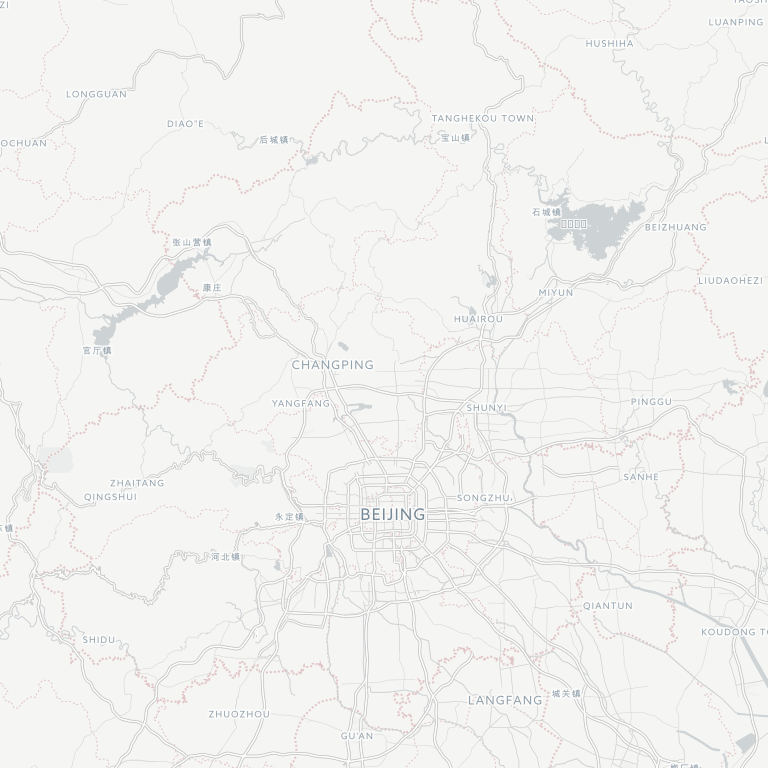

In [20]:
mapBeijing = smopy.Map((latMinB, longMinB, latMaxB, longMaxB ), z=9)
mapBeijing.show_ipython()

In [21]:
df['xPixel'] = mapBeijing.to_pixels(df.lat, df.long)[0]
df['yPixel'] = mapBeijing.to_pixels(df.lat, df.long)[1]

/usr/local/lib/python3.4/dist-packages/smopy.py:143: RuntimeWarning: invalid value encountered in log
  2. * n)


In [22]:
dfBeijing = df[(df.lat.between(latMinB, latMaxB)) & (df.long.between(longMinB, longMaxB))]
df.head()

,time,lat,long,xPixel,yPixel
id,,,,,
8801,2008-02-02 13:34:07,39.8668,116.34217,374.891406,532.37362
8801,2008-02-02 13:34:12,39.8668,116.34217,374.891406,532.37362
8801,2008-02-02 13:34:17,39.8668,116.34217,374.891406,532.37362
8801,2008-02-02 13:34:22,39.8668,116.34217,374.891406,532.37362
8801,2008-02-02 13:34:27,39.8668,116.34217,374.891406,532.37362


In [23]:
cmap = LinearSegmentedColormap.from_list('mycmap', [(0, (1,0,0,0)), (0.5, (1,0.5,0,0.8)), (0.75, (1,1,0,0.8)), (0.875, (1,1,1,1)), (1, (1,1,1,1))])

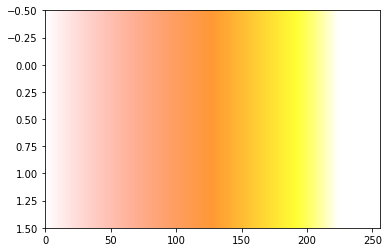

In [24]:
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
fig, ax = plt.subplots()
ax.imshow(gradient, aspect='auto', cmap=cmap)

/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py:12: RuntimeWarning: divide by zero encountered in log
  if sys.path[0] == '':


8.6074615847534695

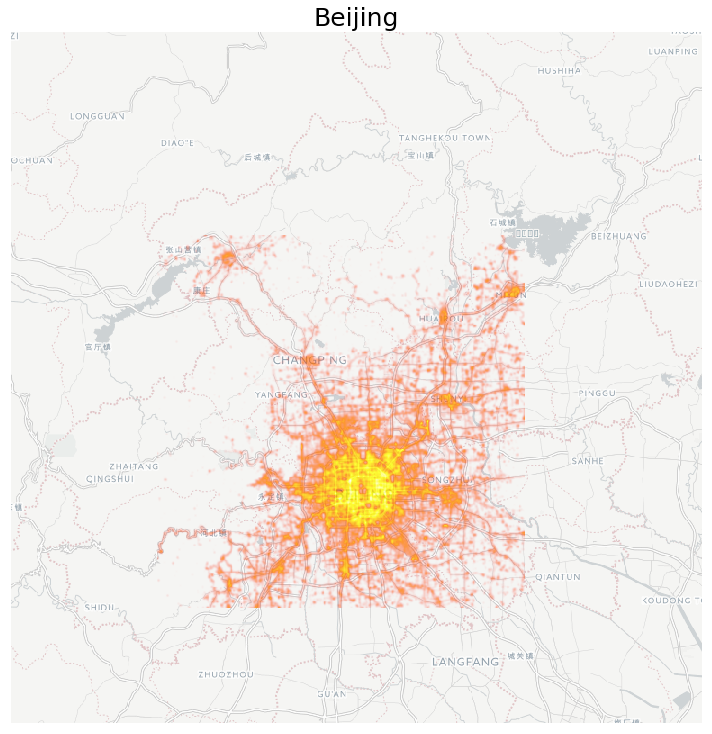

In [25]:
ax = mapBeijing.show_mpl(figsize=(12, 10))
bins=400
smoothing =1.

title = 'Beijing'

x = list(dfBeijing['xPixel'])
y = list(dfBeijing['yPixel'])
heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
logheatmap = np.log(heatmap)
logheatmap[np.isneginf(logheatmap)] = 0
logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')

ax.set_title(title, size=25)

plt.savefig(title+'.png', bbox_inches='tight')
    
ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=10)

plt.savefig(title+'.png', bbox_inches='tight')

np.amax(logheatmap)

In [26]:
def heatMap(long, lat, area, bins=200, smoothing=1, vmax=4, title=None):
    x = area.to_pixels(lat, long)[0]
    y = area.to_pixels(lat, long)[1]
    
    ax = area.show_mpl(figsize=(12, 10))
    
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]
    
    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    output = ax.imshow(logheatmap, cmap=cmap, extent=extent, vmin=0, vmax=vmax)
    
    if title:
        ax.set_title(title, size=25)
        plt.savefig(title+'.png', bbox_inches='tight')
    
    print(np.amax(logheatmap))
    return output

In [27]:
latMin = 39.8
latMax = 40
longMin = 116.2
longMax = 116.4

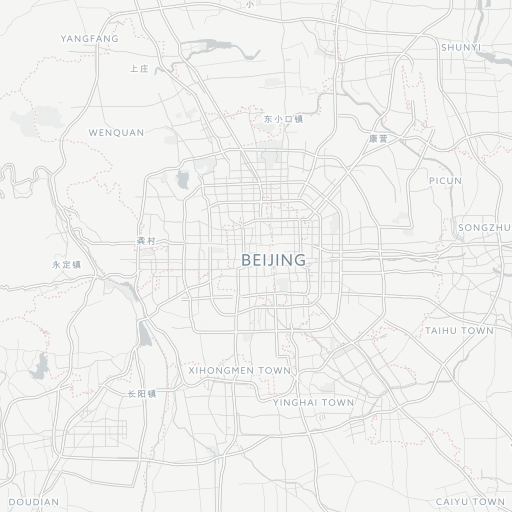

In [28]:
mapZoom = smopy.Map((latMin, longMin, latMax, longMax ), z=10)
mapZoom.show_ipython()

/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


7.80363460079


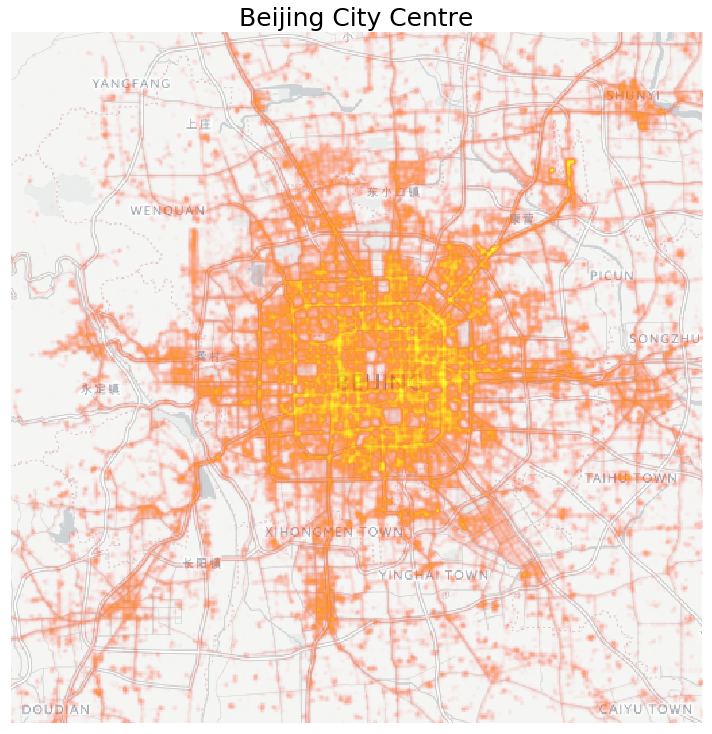

In [29]:
heatMap(dfBeijing.long, dfBeijing.lat, mapZoom, bins=800, vmax=10, title='Beijing City Centre')

In [31]:
def getTime(x):
    return datetime.strptime(str(x), '%H').strftime('%Hh%M')

/usr/local/lib/python3.4/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


4.64710123833
4.76718242213
4.47533011482
4.24424969543
4.11700992998
4.16588492255
4.53229737271
4.95111340897
4.77182084101
4.92818923355
4.9541574067
5.1294507814
5.21141176776
5.326134751
5.41023802508
5.43927743642
5.45752326784
5.49222383949
5.4285925793
4.99791986678


/usr/local/lib/python3.4/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


5.22540942366
5.03106490152
4.98346431137
4.7248562052


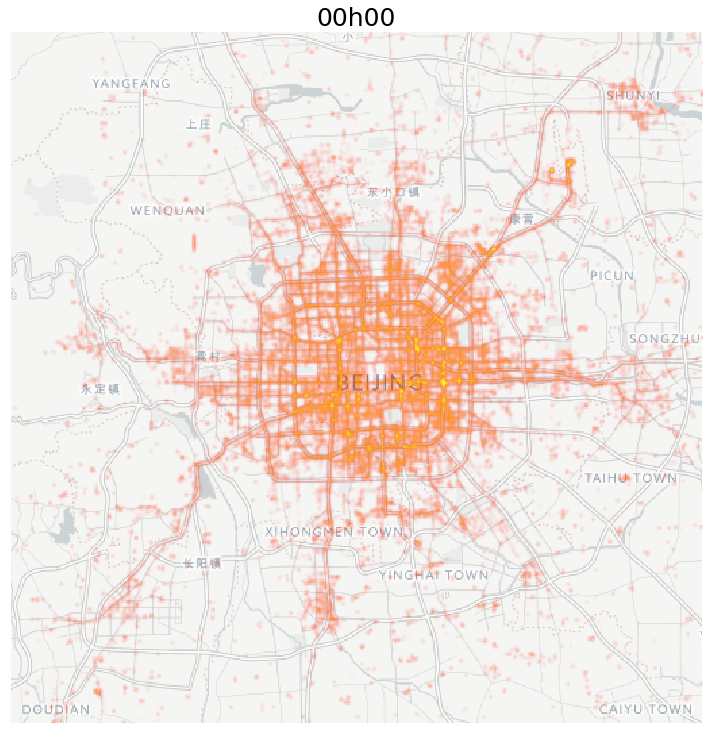

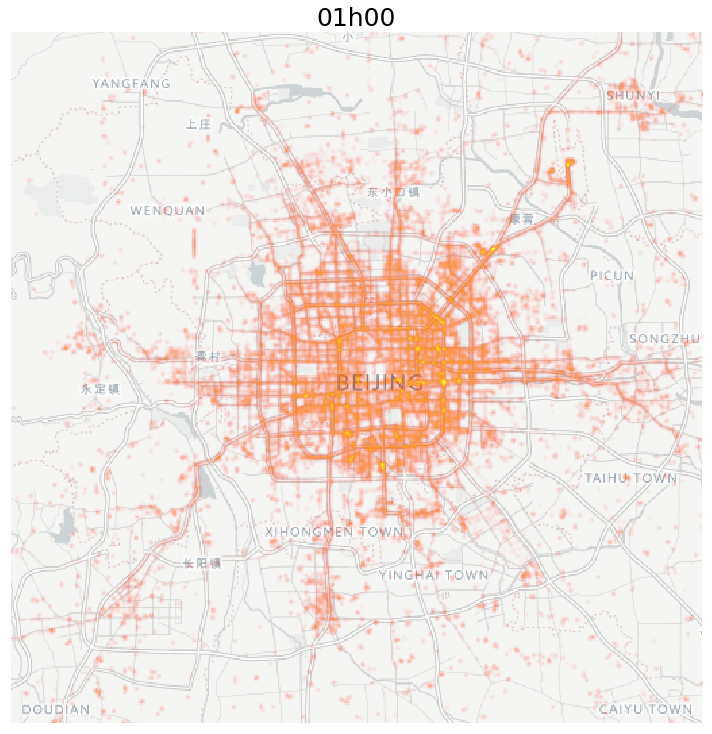

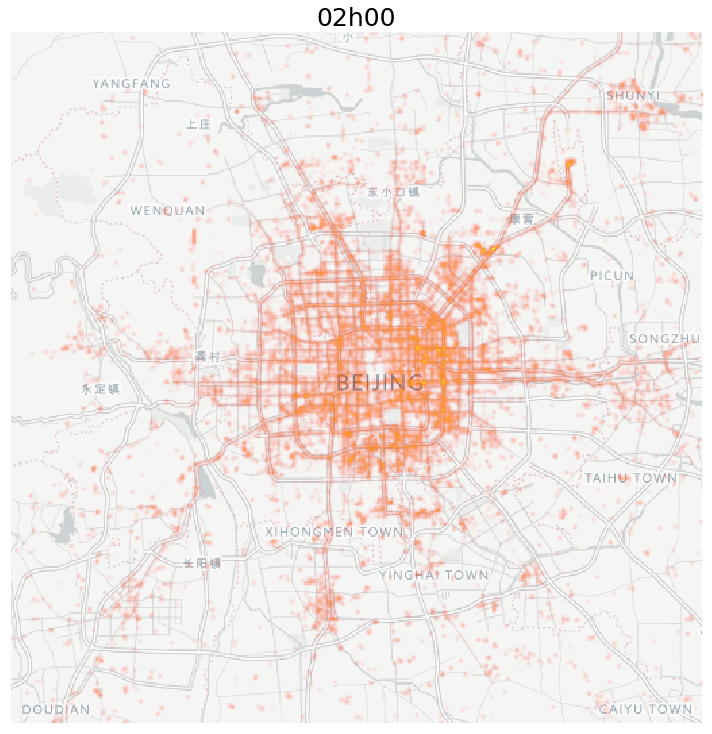

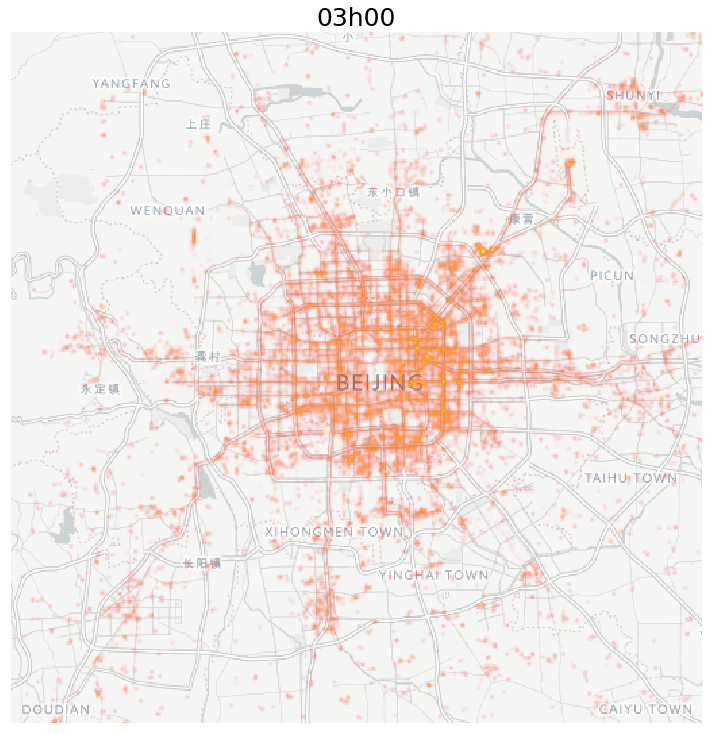

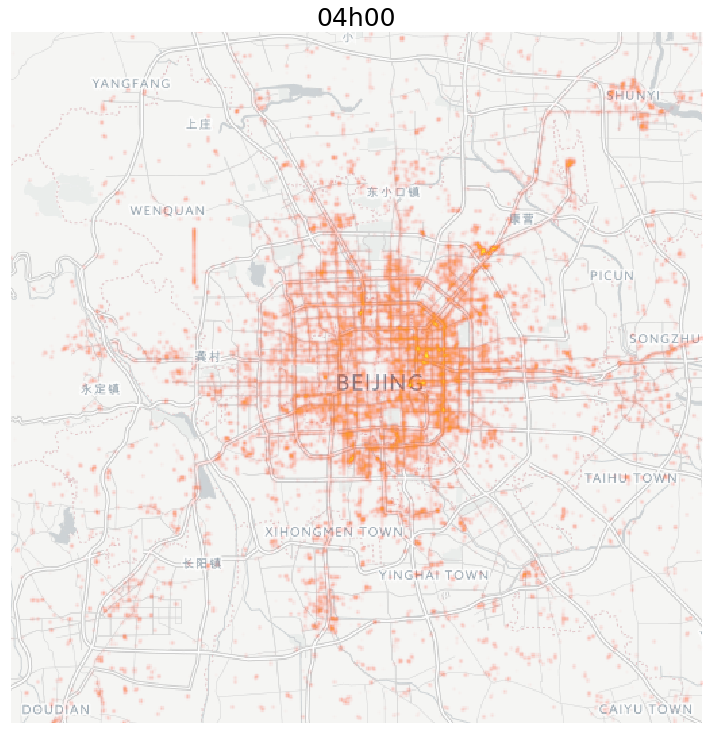

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


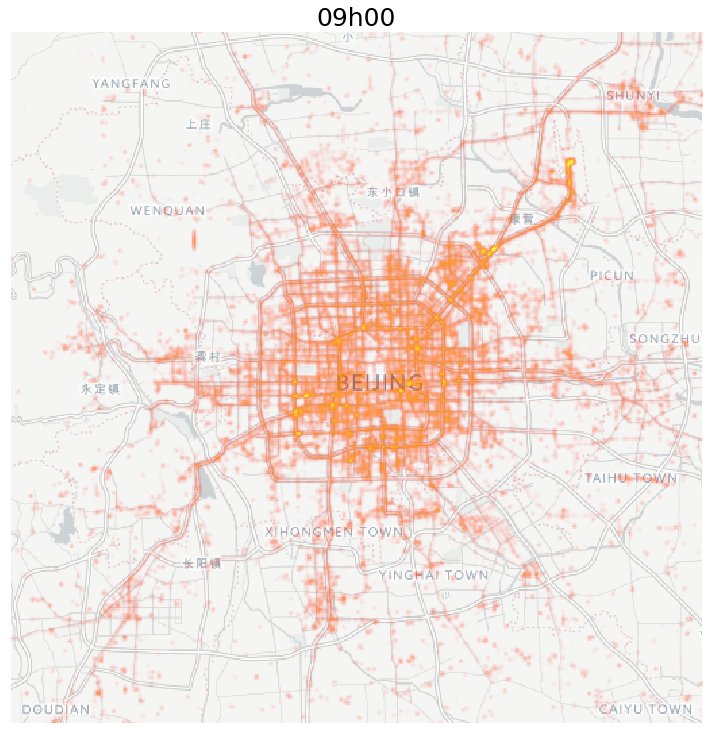

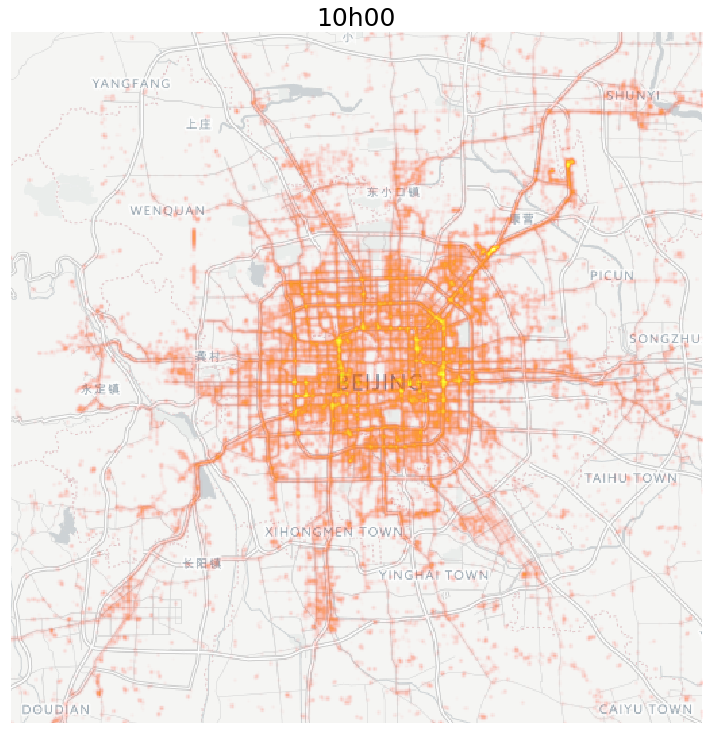

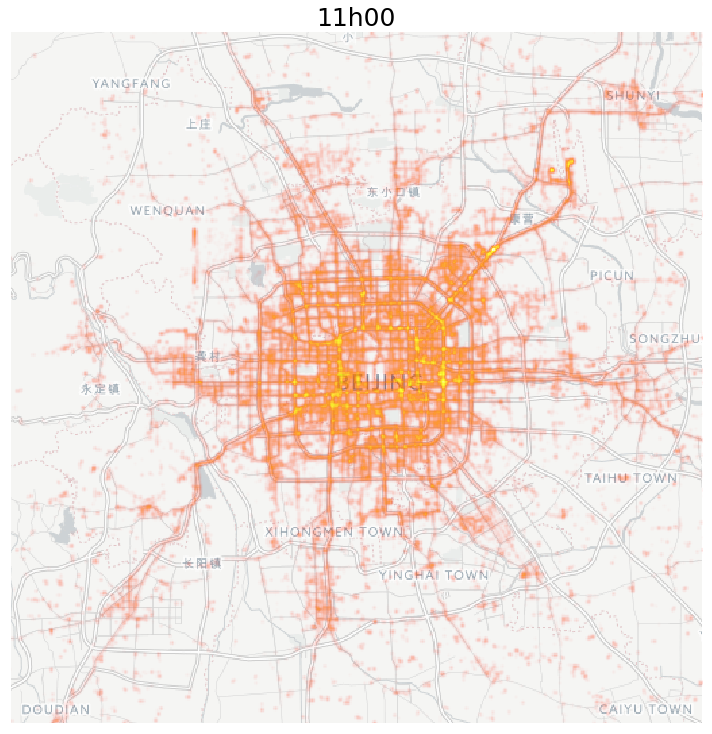

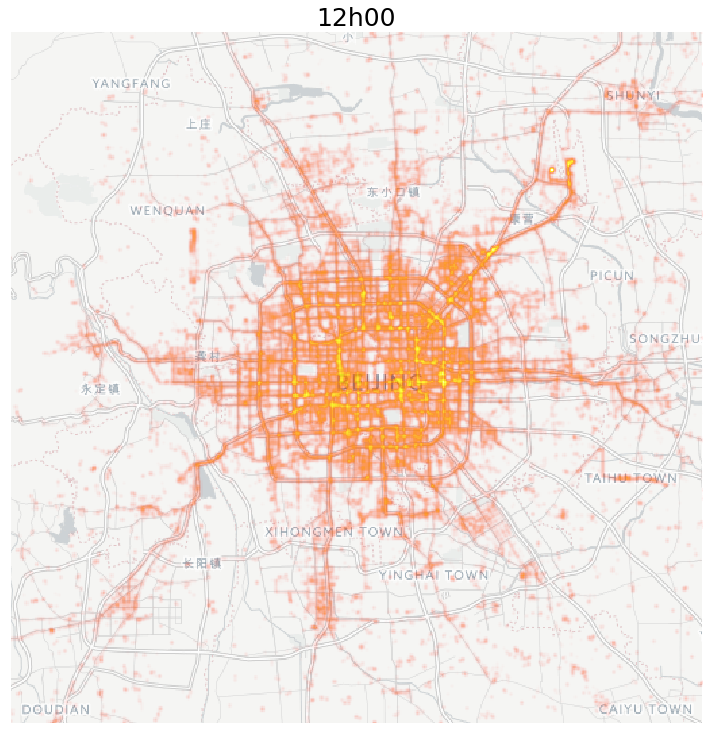

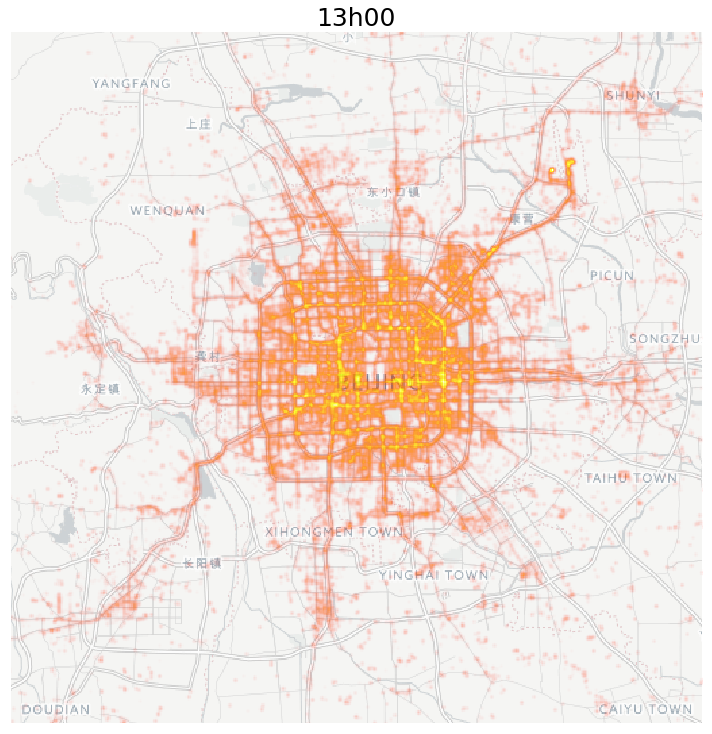

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


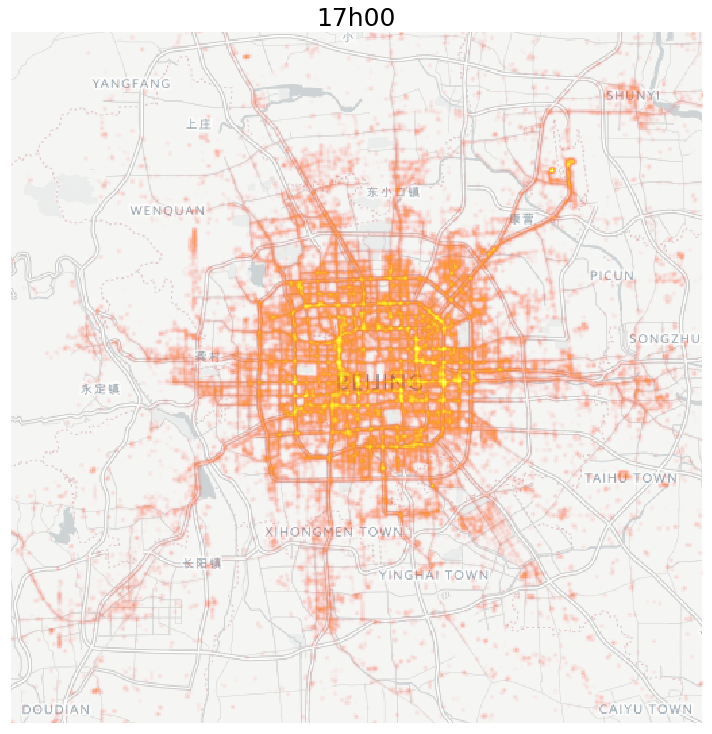

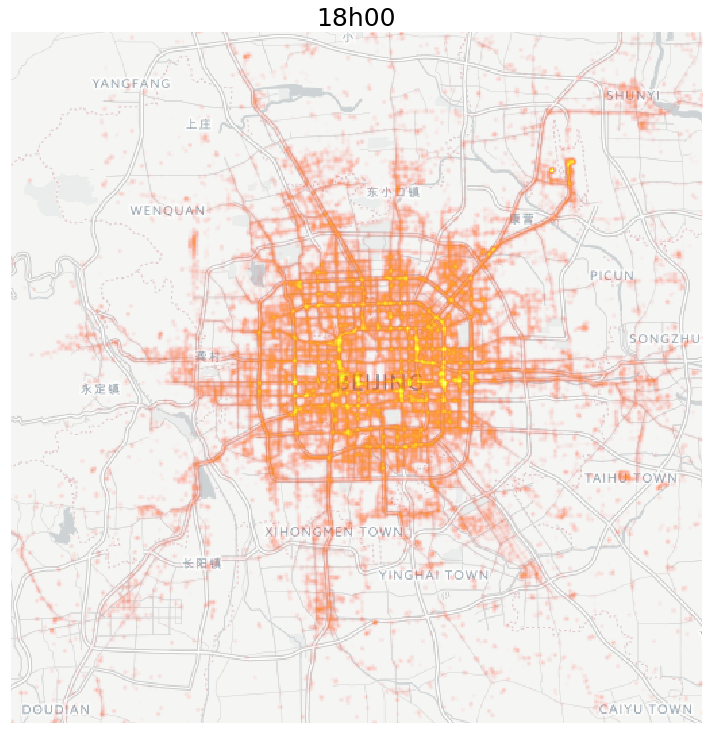

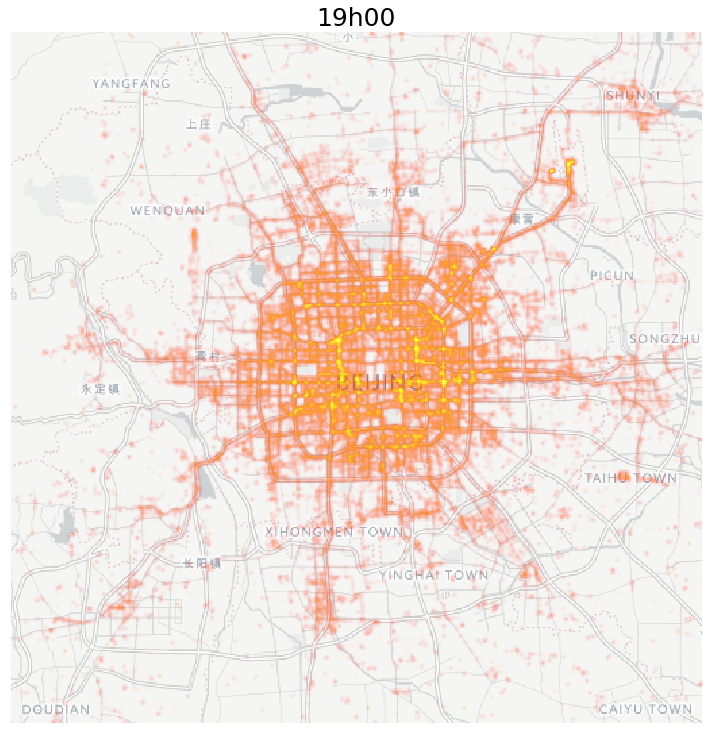

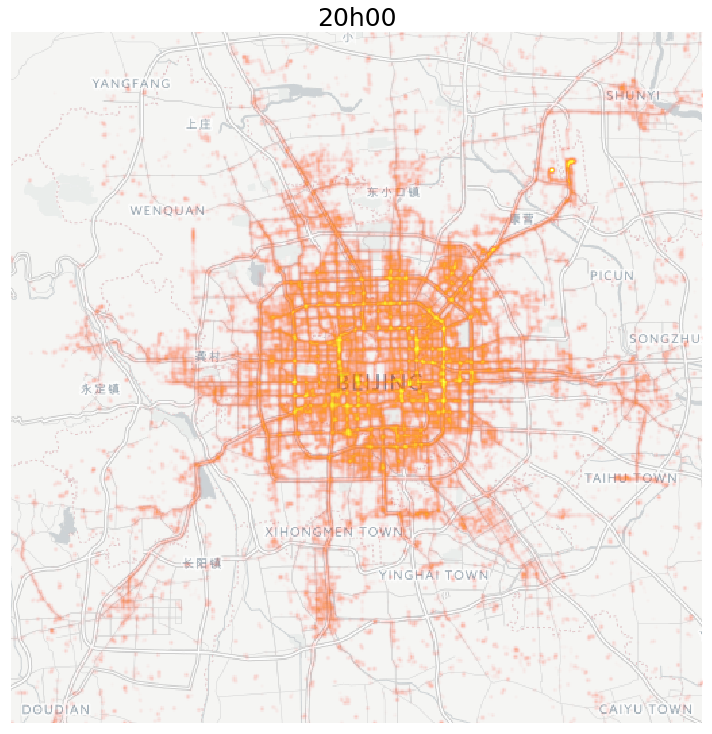

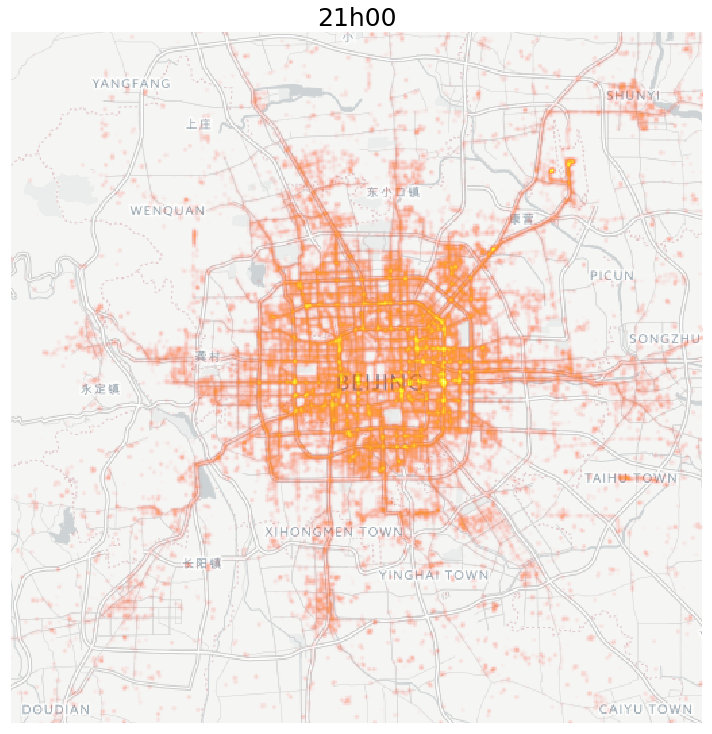

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [33]:
for i in range(24):
    dfHour = dfBeijing[dfBeijing['time'].dt.hour == i]
    heatMap(dfHour.long, dfHour.lat, mapZoom, bins=800, vmax=6, title=getTime(i))

In [34]:
files = glob.glob('*h00.png')
images = []
for file in files:
    images.append(imageio.imread(file))
imageio.mimsave('24hBeijing.gif', images)